# Proof of Value for applying same visual style between cmp_facade_dataset images and Nelissen target images (sketches)

## Goal
The goal of this document is to find if preproccesing both datasets in a specific way could bring value. And to find which methods and threshold range and parameters are aligning best between both datasets of cmp_facade_dataset and nelissen target images (sketches)

Facade images:


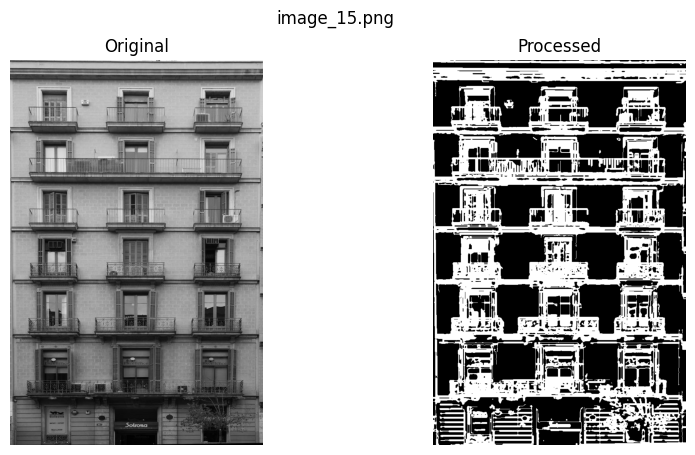

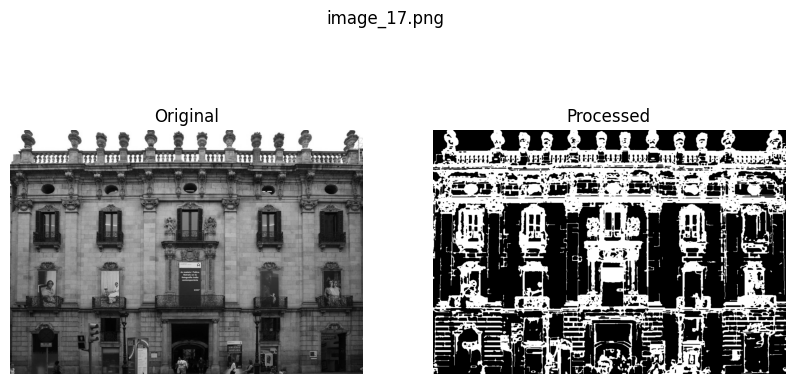

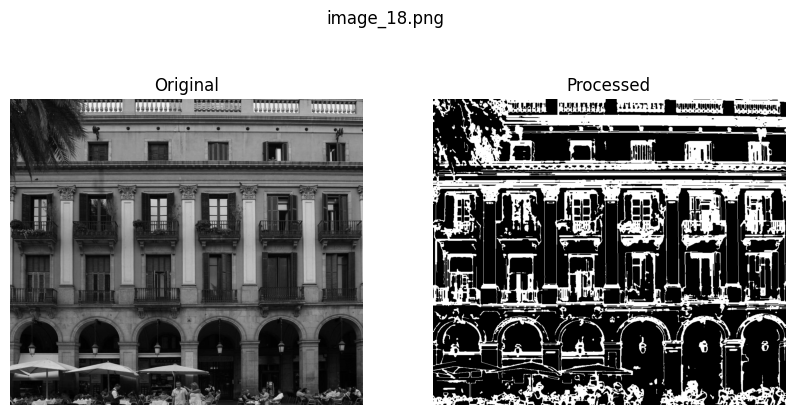

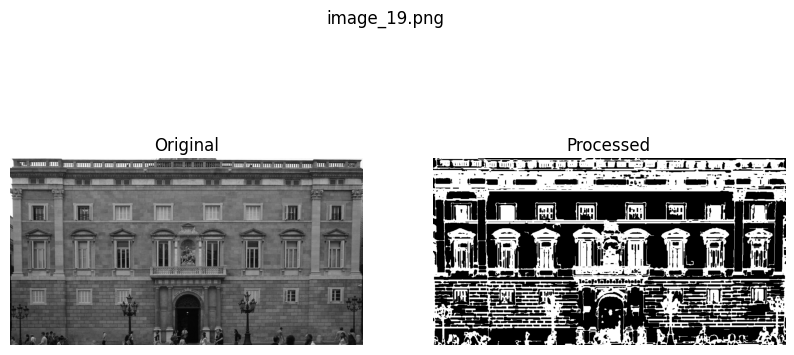

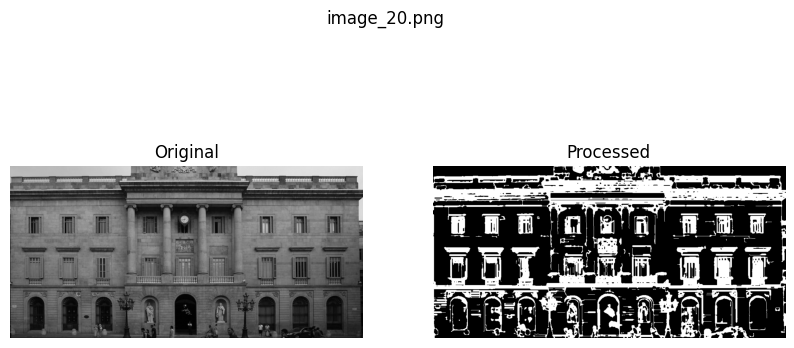

In [38]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Paths to your real facade images
facade_images = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png',
    '../data/cmp_facade_dataset/images/train/image_19.png',
    '../data/cmp_facade_dataset/images/train/image_20.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Refined sketch-like effect for real images
def to_sketch(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply a lighter bilateral filter to reduce noise while preserving edges
    gray = cv2.bilateralFilter(gray, 9, 15, 15)  # Reduced parameters for less smoothing
    
    # Apply a smaller Gaussian blur to simplify details without losing key features
    blurred = cv2.GaussianBlur(gray, (21, 21), 0)  # Reduced kernel size to preserve details
    
    # Apply CLAHE to enhance contrast selectively
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)
    
    # Create sketch effect with blurred image
    sketch = cv2.divide(gray, blurred, scale=256.0)
    
    # Apply Canny edge detection with looser thresholds to capture more edges
    edges = cv2.Canny(gray, 90, 190)  # Loosened thresholds to include windows and balconies
    edges = 255 - edges
    
    # Combine sketch with edges
    sketch = cv2.bitwise_and(sketch, sketch, mask=edges)
    
    # Apply a lighter morphological operation to clean up small noise
    kernel = np.ones((3, 3), np.uint8)  # Smaller kernel to avoid removing key features
    sketch = cv2.morphologyEx(sketch, cv2.MORPH_OPEN, kernel)
    sketch = cv2.GaussianBlur(sketch, (5, 5), 0)  # Light blur to smooth noise
    # Binary threshold adjusted for pencil sketch style
    _, sketch = cv2.threshold(sketch, 180, 255, cv2.THRESH_BINARY_INV)  # Increased threshold for better separation
    
    return sketch

# Show comparison plots for facade images only
def process_and_compare_facades(image_paths, max_images=5):
    for idx, img_path in enumerate(image_paths):
        if idx >= max_images:
            break
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load {img_path}")
            continue
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
        processed = to_sketch(img)
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original")
        plt.imshow(gray, cmap='gray')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.title("Processed")
        plt.imshow(processed, cmap='gray')
        plt.axis('off')
        plt.suptitle(os.path.basename(img_path))
        plt.show()

print("Facade images:")
process_and_compare_facades(facade_images)

## Next step
The previous examples are not bad, however there is too much noise. We need to find a technique and threshold range that works best with our data. So let's try various preproccesing versions..

Facade images (many edge/sketch methods):


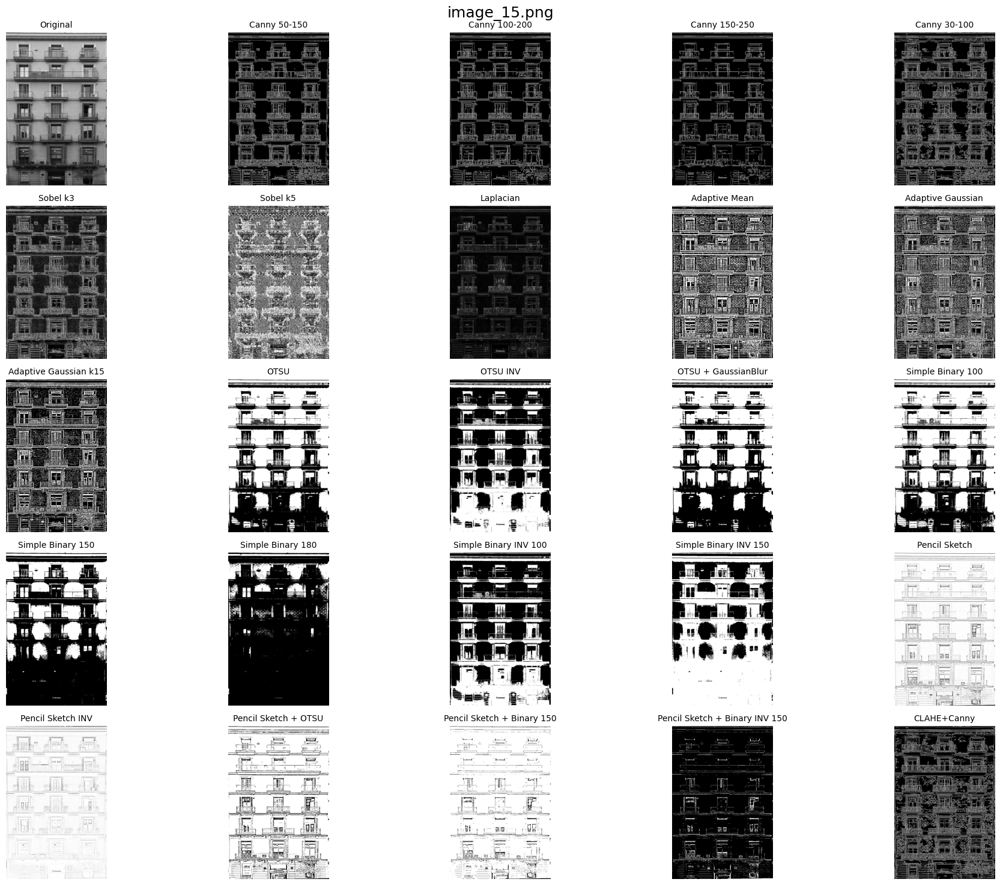

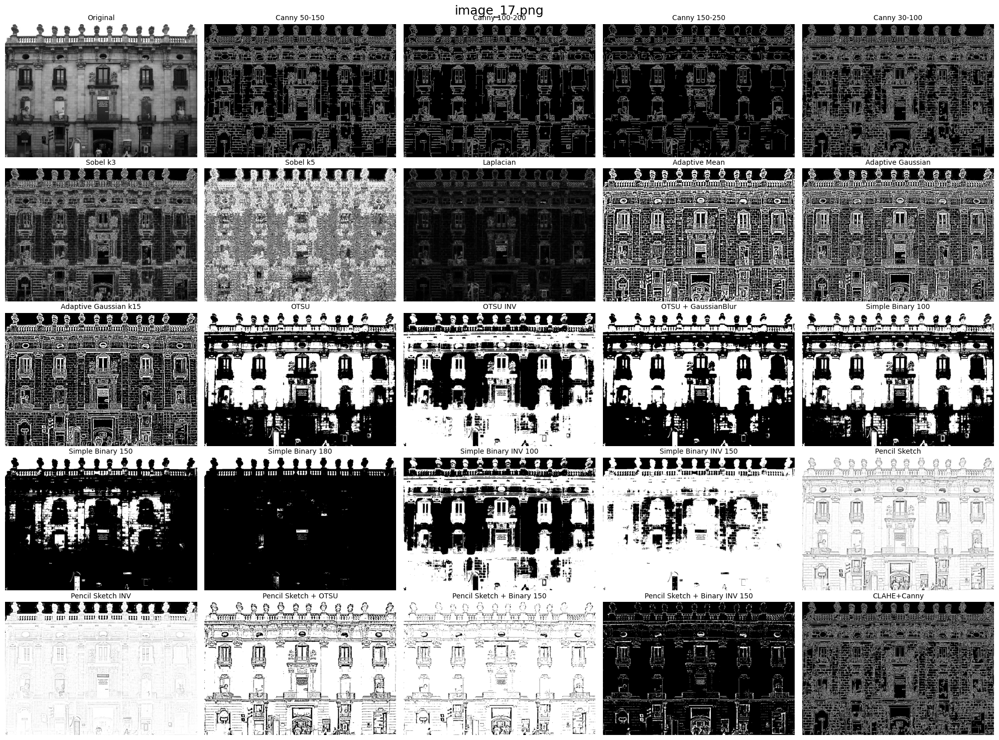

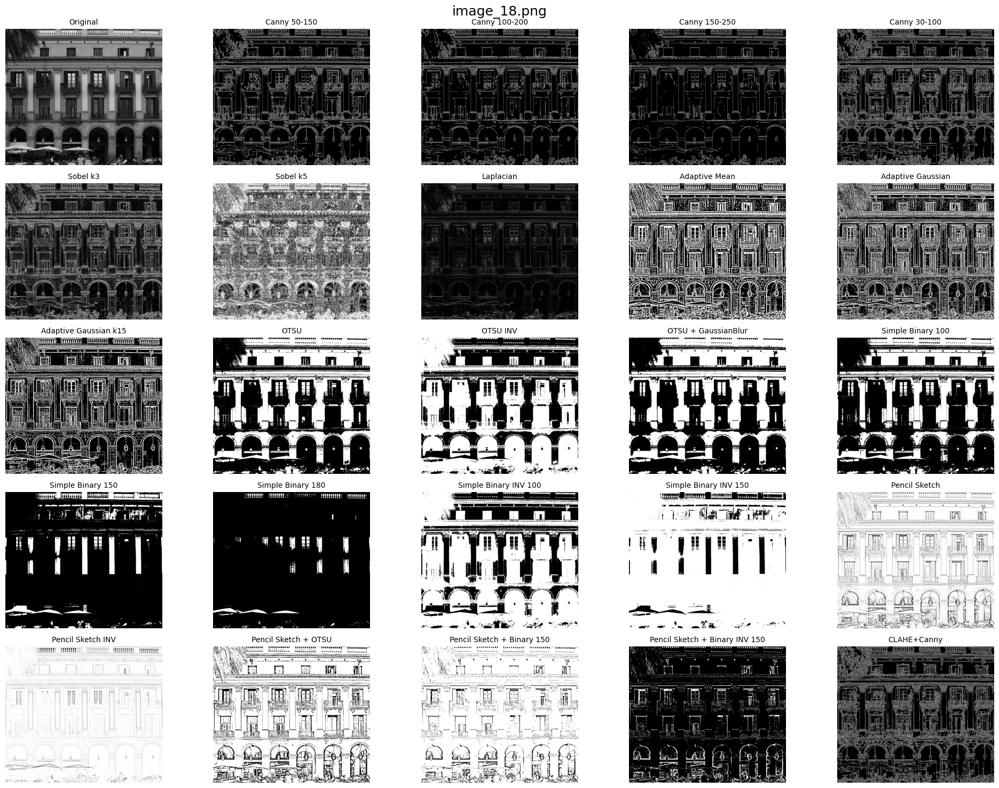

In [40]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Paths to your real facade images
facade_images = [
    '../data/cmp_facade_dataset/images/train/image_15.png',
    '../data/cmp_facade_dataset/images/train/image_17.png',
    '../data/cmp_facade_dataset/images/train/image_18.png',
    '../data/cmp_facade_dataset/images/train/image_19.png',
    '../data/cmp_facade_dataset/images/train/image_20.png',
    '../data/cmp_facade_dataset/images/train/image_18.png'
]

# Extended edge/sketch processing methods or parameter sets
def edge_methods():
    return [
        ("Original", lambda img: img),
        ("Canny 50-150", lambda img: cv2.Canny(img, 50, 150)),
        ("Canny 100-200", lambda img: cv2.Canny(img, 100, 200)),
        ("Canny 150-250", lambda img: cv2.Canny(img, 150, 250)),
        ("Canny 30-100", lambda img: cv2.Canny(img, 30, 100)),
        ("Sobel k3", lambda img: cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)) + cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3))),
        ("Sobel k5", lambda img: cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)) + cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5))),
        ("Laplacian", lambda img: cv2.convertScaleAbs(cv2.Laplacian(img, cv2.CV_64F))),
        ("Adaptive Mean", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)),
        ("Adaptive Gaussian", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)),
        ("Adaptive Gaussian k15", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 4)),
        ("OTSU", lambda img: cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("OTSU INV", lambda img: cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]),
        ("OTSU + GaussianBlur", lambda img: cv2.threshold(cv2.GaussianBlur(img, (5,5), 0), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("Simple Binary 100", lambda img: cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary 150", lambda img: cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary 180", lambda img: cv2.threshold(img, 180, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary INV 100", lambda img: cv2.threshold(img, 100, 255, cv2.THRESH_BINARY_INV)[1]),
        ("Simple Binary INV 150", lambda img: cv2.threshold(img, 150, 255, cv2.THRESH_BINARY_INV)[1]),
        ("Pencil Sketch", lambda img: cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0)),
        ("Pencil Sketch INV", lambda img: cv2.divide(255-img, cv2.GaussianBlur(255-img, (21, 21), 0), scale=256.0)),
        ("Pencil Sketch + OTSU", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("Pencil Sketch + Binary 150", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 150, 255, cv2.THRESH_BINARY)[1]),
        ("Pencil Sketch + Binary INV 150", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 150, 255, cv2.THRESH_BINARY_INV)[1]),
        ("CLAHE+Canny", lambda img: cv2.Canny(cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img), 50, 150)),
    ]

def process_and_plot_all_methods(image_paths, max_images=3):
    methods = edge_methods()
    n_methods = len(methods)
    n_cols = 5
    n_rows = int(np.ceil(n_methods / n_cols))
    for idx, img_path in enumerate(image_paths):
        if idx >= max_images:
            break
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load {img_path}")
            continue
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        processed_images = []
        for name, func in methods:
            try:
                processed = func(gray)
                processed_images.append((name, processed))
            except Exception as e:
                processed_images.append((name, np.zeros_like(gray)))
                print(f"Error in {name}: {e}")

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
        fig.suptitle(os.path.basename(img_path), fontsize=18)
        for ax, (name, processed) in zip(axes.flatten(), processed_images):
            ax.imshow(processed, cmap='gray')
            ax.set_title(name, fontsize=10)
            ax.axis('off')
        # Hide any unused axes
        for ax in axes.flatten()[len(processed_images):]:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

print("Facade images (many edge/sketch methods):")
process_and_plot_all_methods(facade_images, max_images=3)

Sketch images (many edge/sketch methods):


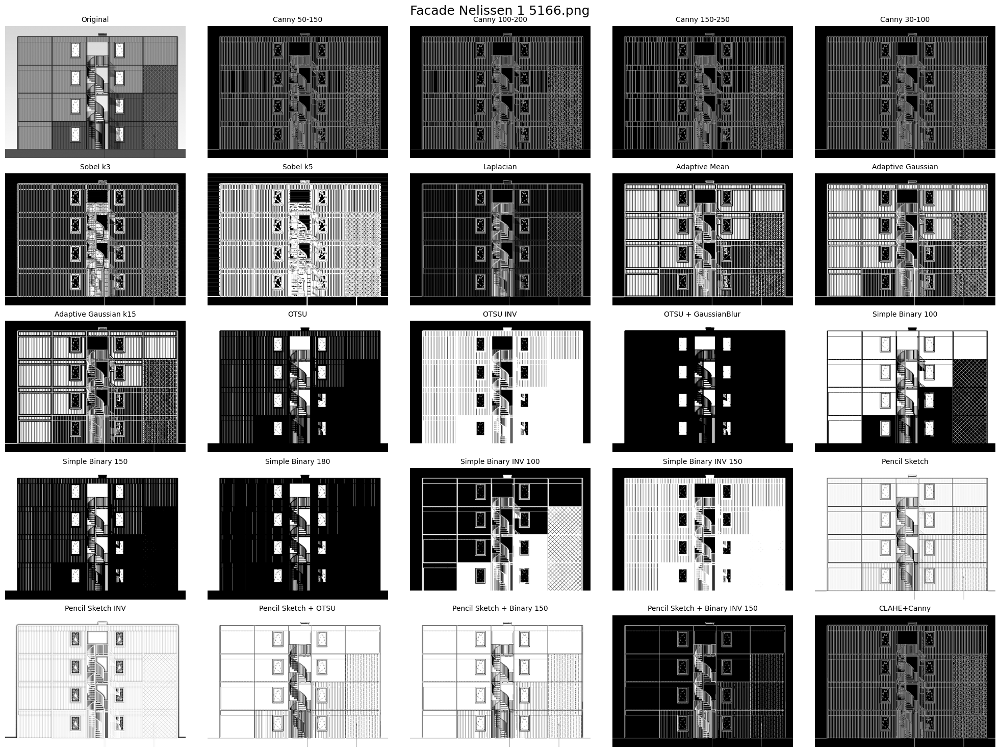

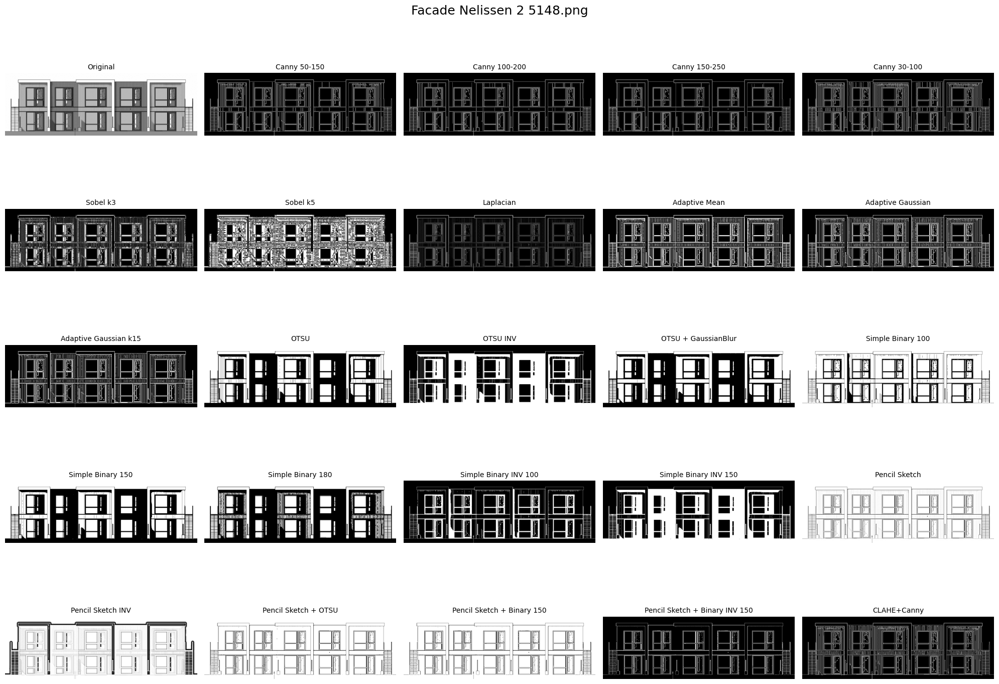

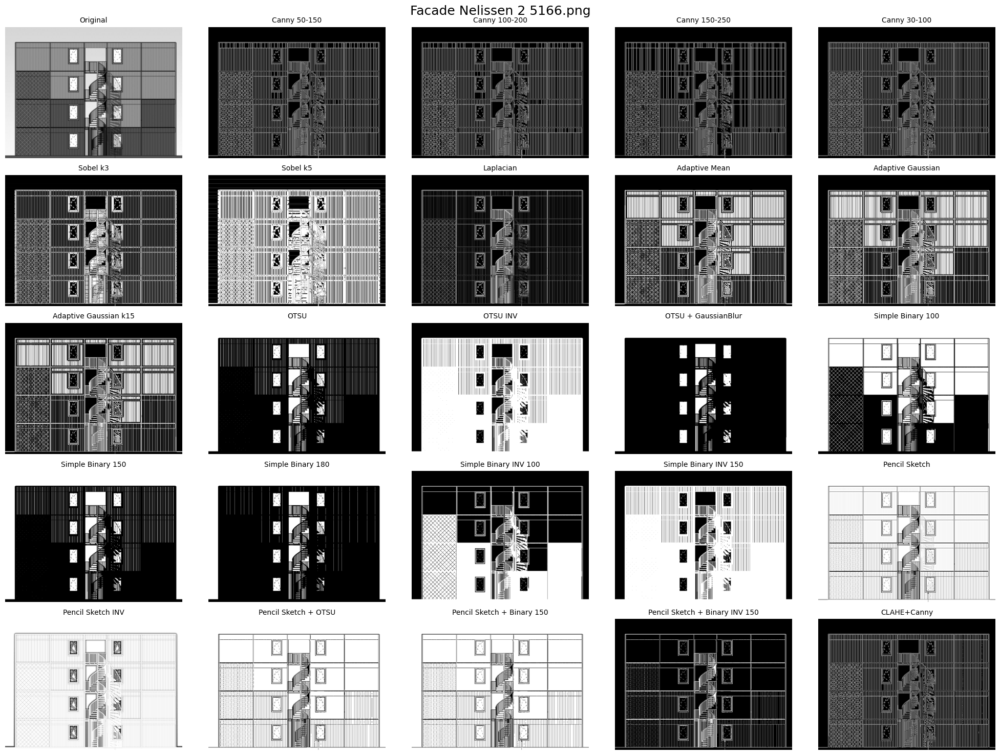

In [41]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Paths to your sketch images only
sketch_images = [
    "../data-samples/Nelissen Fotos/Facade Nelissen 1 5166.png",
    "../data-samples/Nelissen Fotos/Facade Nelissen 2 5148.png",
    "../data-samples/Nelissen Fotos/Facade Nelissen 2 5166.png"
]

# Extended edge/sketch processing methods or parameter sets for sketches
def edge_methods_sketch():
    return [
        ("Original", lambda img: img),
        ("Canny 50-150", lambda img: cv2.Canny(img, 50, 150)),
        ("Canny 100-200", lambda img: cv2.Canny(img, 100, 200)),
        ("Canny 150-250", lambda img: cv2.Canny(img, 150, 250)),
        ("Canny 30-100", lambda img: cv2.Canny(img, 30, 100)),
        ("Sobel k3", lambda img: cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)) + cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3))),
        ("Sobel k5", lambda img: cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)) + cv2.convertScaleAbs(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5))),
        ("Laplacian", lambda img: cv2.convertScaleAbs(cv2.Laplacian(img, cv2.CV_64F))),
        ("Adaptive Mean", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)),
        ("Adaptive Gaussian", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)),
        ("Adaptive Gaussian k15", lambda img: cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 4)),
        ("OTSU", lambda img: cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("OTSU INV", lambda img: cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]),
        ("OTSU + GaussianBlur", lambda img: cv2.threshold(cv2.GaussianBlur(img, (5,5), 0), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("Simple Binary 100", lambda img: cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary 150", lambda img: cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary 180", lambda img: cv2.threshold(img, 180, 255, cv2.THRESH_BINARY)[1]),
        ("Simple Binary INV 100", lambda img: cv2.threshold(img, 100, 255, cv2.THRESH_BINARY_INV)[1]),
        ("Simple Binary INV 150", lambda img: cv2.threshold(img, 150, 255, cv2.THRESH_BINARY_INV)[1]),
        ("Pencil Sketch", lambda img: cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0)),
        ("Pencil Sketch INV", lambda img: cv2.divide(255-img, cv2.GaussianBlur(255-img, (21, 21), 0), scale=256.0)),
        ("Pencil Sketch + OTSU", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]),
        ("Pencil Sketch + Binary 150", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 150, 255, cv2.THRESH_BINARY)[1]),
        ("Pencil Sketch + Binary INV 150", lambda img: cv2.threshold(cv2.divide(img, cv2.GaussianBlur(img, (21, 21), 0), scale=256.0), 150, 255, cv2.THRESH_BINARY_INV)[1]),
        ("CLAHE+Canny", lambda img: cv2.Canny(cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(img), 50, 150)),
    ]

def process_and_plot_all_methods_sketch(image_paths, max_images=3):
    methods = edge_methods_sketch()
    n_methods = len(methods)
    n_cols = 5
    n_rows = int(np.ceil(n_methods / n_cols))
    for idx, img_path in enumerate(image_paths):
        if idx >= max_images:
            break
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load {img_path}")
            continue
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        processed_images = []
        for name, func in methods:
            try:
                processed = func(gray)
                processed_images.append((name, processed))
            except Exception as e:
                processed_images.append((name, np.zeros_like(gray)))
                print(f"Error in {name}: {e}")

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
        fig.suptitle(os.path.basename(img_path), fontsize=18)
        for ax, (name, processed) in zip(axes.flatten(), processed_images):
            ax.imshow(processed, cmap='gray')
            ax.set_title(name, fontsize=10)
            ax.axis('off')
        # Hide any unused axes
        for ax in axes.flatten()[len(processed_images):]:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

print("Sketch images (many edge/sketch methods):")
process_and_plot_all_methods_sketch(sketch_images, max_images=3)

## Explanation:
The Pencil Sketch method (seen in both datasets) provides a clear, consistent line-art representation that highlights edges and boundaries, which are critical for segmentation tasks like identifying windows, balconies, and walls.
Comparing the Pencil Sketch results across both datasets, they show similar levels of detail and abstraction, aligning the styles effectively. <br>Other methods like Canny or Sobel add noise or vary in edge intensity (e.g., Canny 50-150 vs. 100-200), which could introduce inconsistencies.
The Pencil Sketch + Binary or INV variations add additional thresholding that might lose some detail, making them less ideal for maintaining alignment.

## Final Combination:
Train on real facade images preprocessed with Pencil Sketch.</br>
Test and predict on sketches preprocessed with Pencil Sketch.